In [ ]:
import spatialdata as sd
import spatialdata_io
import spatialdata_plot
import sparrow as sp
from sparrow.io._visium_hd import visium_hd
from napari_spatialdata import Interactive
import scanpy as sc
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Import _rasterize_bins from ../utils/rasterize_bins.py
import sys
sys.path.append('../utils')
from rasterize_bins import _rasterize_bins


/home/chananchidas/miniconda3/envs/napari-sparrow/lib/python3.10/site-packages/dask/dataframe/__init__.py:31: FutureWarning: The legacy Dask DataFrame implementation is deprecated and will be removed in a future version. Set the configuration option `dataframe.query-planning` to `True` or None to enable the new Dask Dataframe implementation and silence this warning.
  warnings.warn(
/home/chananchidas/miniconda3/envs/napari-sparrow/lib/python3.10/site-packages/pyproj/network.py:59: UserWarning: pyproj unable to set PROJ database path.
  _set_context_ca_bundle_path(ca_bundle_path)
/home/chananchidas/miniconda3/envs/napari-sparrow/lib/python3.10/site-packages/xarray_schema/__init__.py:1: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import DistributionNotFound, get_distribut

In this notebook, we are going to preprocess the 8um bin size according to the single-cell analysis pipeline.

In [2]:
sc.set_figure_params(facecolor="white", figsize=(8, 8))
sc.settings.n_jobs = 1
sc.settings.verbosity = 3

In [5]:
sdata = sd.read_zarr('../data/Visium_HD_Liver/Visium_HD_Liver_zarr')

/home/chananchidas/miniconda3/envs/napari-sparrow/lib/python3.10/site-packages/zarr/creation.py:614: UserWarning: ignoring keyword argument 'read_only'
  compressor, fill_value = _kwargs_compat(compressor, fill_value, kwargs)
/home/chananchidas/miniconda3/envs/napari-sparrow/lib/python3.10/site-packages/zarr/creation.py:614: UserWarning: ignoring keyword argument 'read_only'
  compressor, fill_value = _kwargs_compat(compressor, fill_value, kwargs)
/home/chananchidas/miniconda3/envs/napari-sparrow/lib/python3.10/site-packages/zarr/creation.py:614: UserWarning: ignoring keyword argument 'read_only'
  compressor, fill_value = _kwargs_compat(compressor, fill_value, kwargs)
/home/chananchidas/miniconda3/envs/napari-sparrow/lib/python3.10/site-packages/zarr/creation.py:614: UserWarning: ignoring keyword argument 'read_only'
  compressor, fill_value = _kwargs_compat(compressor, fill_value, kwargs)
/home/chananchidas/miniconda3/envs/napari-sparrow/lib/python3.10/site-packages/zarr/creation.py:

In [4]:
sdata

SpatialData object, with associated Zarr store: /home/chananchidas/visium-hd/data/Visium_HD_Liver/Visium_HD_Liver_zarr
├── Images
│     ├── 'Visium_HD_Liver_full_image': DataTree[cyx] (3, 32447, 49192), (3, 16223, 24596), (3, 8111, 12298), (3, 4055, 6149), (3, 2027, 3074)
│     ├── 'Visium_HD_Liver_hires_image': DataArray[cyx] (3, 3958, 6000)
│     └── 'Visium_HD_Liver_lowres_image': DataArray[cyx] (3, 396, 600)
├── Labels
│     ├── 'Visium_HD_Liver_square_002um_labels': DataArray[yx] (3347, 3350)
│     ├── 'Visium_HD_Liver_square_008um_labels': DataArray[yx] (837, 838)
│     ├── 'Visium_HD_Liver_square_016um_labels': DataArray[yx] (419, 419)
│     ├── 'Visium_HD_Liver_square_032um_labels': DataArray[yx] (32447, 49192)
│     └── 'segmentation_mask': DataArray[yx] (32447, 49192)
├── Shapes
│     ├── 'Visium_HD_Liver_square_002um': GeoDataFrame shape: (7375079, 1) (2D shapes)
│     ├── 'Visium_HD_Liver_square_008um': GeoDataFrame shape: (462269, 1) (2D shapes)
│     ├── 'Visium_HD_Liver_

INFO     Rasterizing image for faster rendering.                                                                   


/home/chananchidas/miniconda3/envs/harpy2/lib/python3.10/site-packages/spatialdata/_core/spatialdata.py:165: UserWarning: The table is annotating 'segmentation_mask', which is not present in the SpatialData object.
  self.validate_table_in_spatialdata(v)
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.09170306..1.0].


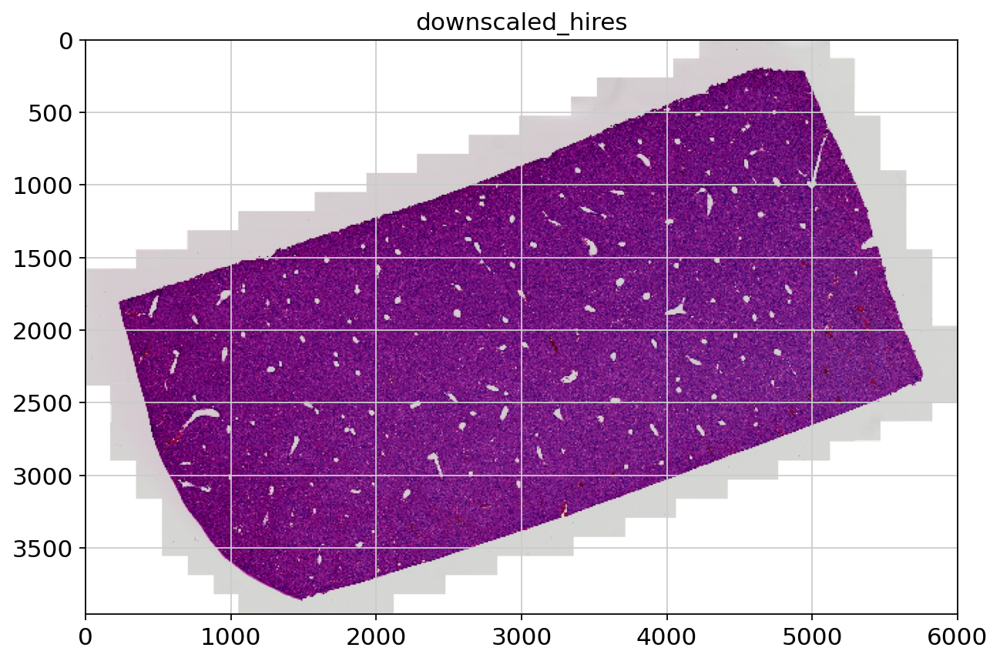

In [5]:
sdata.pl.render_images("Visium_HD_Liver_hires_image").pl.show(coordinate_systems="downscaled_hires")

In [ ]:
# We will change some AnnData properties to make it compatible with sparrow functions
# See https://github.com/saeyslab/napari-sparrow/blob/main/src/sparrow/io/_visium_hd.py
from sparrow.utils._keys import _INSTANCE_KEY, _REGION_KEY
from spatialdata.models import TableModel
from spatialdata_io._constants._constants import VisiumHDKeys

for tables_layer in [*sdata.tables]:
    adata = sdata[tables_layer]
    adata.var_names_make_unique()
    adata.X = adata.X.tocsc()

    adata.obs.rename(
        columns={VisiumHDKeys.REGION_KEY: _REGION_KEY, VisiumHDKeys.INSTANCE_KEY: _INSTANCE_KEY}, inplace=True
    )
    adata.uns.pop(TableModel.ATTRS_KEY)
    adata = TableModel.parse(
        adata,
        region_key=_REGION_KEY,
        region=adata.obs[_REGION_KEY].cat.categories.to_list(),
        instance_key=_INSTANCE_KEY,
    )

    del sdata[tables_layer]

    sdata[tables_layer] = adata

for shapes_layer in [*sdata.shapes]:
    sdata[shapes_layer].index.name = _INSTANCE_KEY


## QC and preprocessing

We perform some basic filtering of spots based on total counts and expressed genes on the 8um bin

In [5]:
adata = sdata.tables['square_008um']
adata

AnnData object with n_obs × n_vars = 461427 × 17588
    obs: 'cell_ID', 'in_tissue', 'array_row', 'array_col', 'fov_labels', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'n_counts', 'clusters'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'clusters', 'clusters_colors', 'hvg', 'log1p', 'neighbors', 'pca', 'spatialdata_attrs', 'umap'
    obsm: 'X_pca', 'X_umap', 'spatial'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

In [6]:
adata.var["mt"] = adata.var_names.str.startswith("Mt-")
sc.pp.calculate_qc_metrics(adata, qc_vars=["mt"], inplace=True)

<Axes: xlabel='n_genes_by_counts', ylabel='Count'>

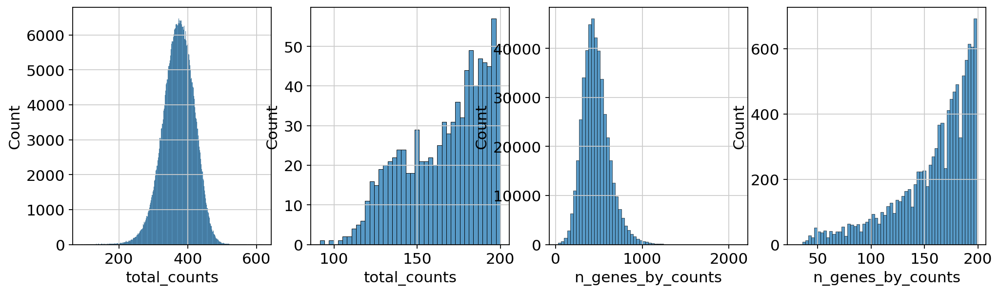

In [25]:
fig, axs = plt.subplots(1, 4, figsize=(15, 4))
sns.histplot(adata.obs["total_counts"], kde=False, ax=axs[0])
sns.histplot(
    adata.obs["total_counts"][adata.obs["total_counts"] < 200],
    kde=False,
    bins=40,
    ax=axs[1],
)
sns.histplot(adata.obs["n_genes_by_counts"], kde=False, bins=60, ax=axs[2])
sns.histplot(
    adata.obs["n_genes_by_counts"][adata.obs["n_genes_by_counts"] < 200],
    kde=False,
    bins=60,
    ax=axs[3],
)

In [8]:
sc.pp.filter_cells(adata, min_counts=50)
# sc.pp.filter_cells(adata, max_counts=4000)
adata = adata[adata.obs["pct_counts_mt"] < 20].copy()
print(f"#cells after MT filter: {adata.n_obs}")
sc.pp.filter_genes(adata, min_cells=10)

#cells after MT filter: 461427


We proceed to normalize Visium counts data with the built-in `normalize_total` method from Scanpy, and detect highly-variable genes (for later). Note that there are alternatives for normalization (see discussion in [[Luecken19](https://www.embopress.org/doi/full/10.15252/msb.20188746)], and more recent alternatives such as [SCTransform](https://genomebiology.biomedcentral.com/articles/10.1186/s13059-019-1874-1) or [GLM-PCA](https://genomebiology.biomedcentral.com/articles/10.1186/s13059-019-1861-6)).

In [9]:
sc.pp.normalize_total(adata, inplace=True)
sc.pp.log1p(adata)
sc.pp.highly_variable_genes(adata, flavor="seurat", n_top_genes=2000)

normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


## Manifold embedding and clustering based on transcriptional similarity

To embed and cluster the manifold encoded by transcriptional similarity, we proceed as in the standard clustering tutorial.

In [10]:
sc.pp.pca(adata)
sc.pp.neighbors(adata)
sc.tl.umap(adata)
sc.tl.leiden(
    adata, key_added="clusters", flavor="igraph", directed=False, n_iterations=2
)

computing PCA
    with n_comps=50
    finished (0:00:03)
computing neighbors
    using 'X_pca' with n_pcs = 50


/home/chananchidas/miniconda3/envs/harpy/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:01:22)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm)
    'umap', UMAP parameters (adata.uns) (0:07:13)
running Leiden clustering
    finished: found 7 clusters and added
    'clusters', the cluster labels (adata.obs, categorical) (0:00:23)


In [ ]:
# Save adata as pp
# sdata.tables["square_008um_pp"] = adata
# sdata.write_element("square_008um_pp")

In [ ]:
import pandas as pd

sdata.tables["square_008um_pp"].obsm["X_umap"]
# Create a dataframe with UMAP coordinates and cluster information
umap_df = pd.DataFrame(
    sdata.tables["square_008um_pp"].obsm["X_umap"],
    columns=["UMAP1", "UMAP2"],
    index=sdata.tables["square_008um_pp"].obs_names
)
umap_df["cluster"] = sdata.tables["square_008um_pp"].obs["clusters"]

umap_df
# Output the dataframe to a CSV file
# umap_df.to_csv("Visium_HD_Liver_008um_umap_clusters.csv")

,UMAP1,UMAP2,cluster
s_008um_00301_00321-1,11.346134,4.125568,0
s_008um_00602_00290-1,2.223399,-0.301374,4
s_008um_00425_00829-1,9.819324,5.235116,0
s_008um_00526_00291-1,5.009274,0.737952,2
s_008um_00128_00278-1,4.500328,1.021895,2
...,...,...,...
s_008um_00252_00421-1,7.934456,1.097432,2
s_008um_00384_00793-1,9.660292,4.091149,0
s_008um_00565_00244-1,12.111323,3.527153,3
s_008um_00353_00477-1,10.145635,2.910759,3


We plot some covariates to check if there is any particular structure in the UMAP associated with total counts and detected genes.

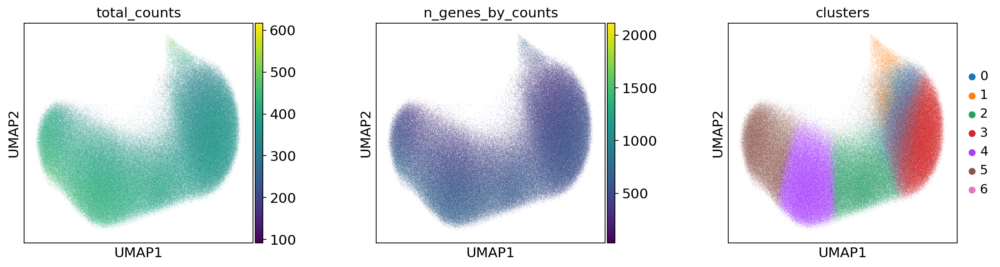

In [23]:
plt.rcParams["figure.figsize"] = (4, 4)
sc.pl.umap(adata, color=["total_counts", "n_genes_by_counts", "clusters"], wspace=0.4)

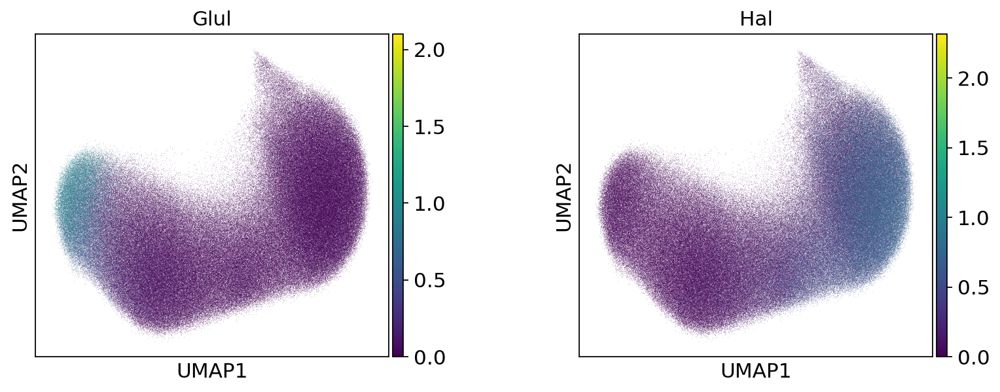

In [24]:
# Plot some liver zonation markers
zonation_markers = ['Glul', 'Hal']
sc.pl.umap(adata, color=zonation_markers, wspace=0.4)

## Visualization in spatial coordinates

Let us now take a look at how `total_counts` and `n_genes_by_counts` behave in spatial coordinates. We will overlay the circular spots on top of the Hematoxylin and eosin stain (H&E) image provided.

In [ ]:
sdata.tables["square_008um"] = adata

/home/chananchidas/miniconda3/envs/harpy2/lib/python3.10/site-packages/spatialdata/_core/_elements.py:116: UserWarning: Key `square_008um` already exists. Overwriting it in-memory.
  self._check_key(key, self.keys(), self._shared_keys)


In [ ]:
labels_layer = "Visium_HD_Liver_square_008um_labels"

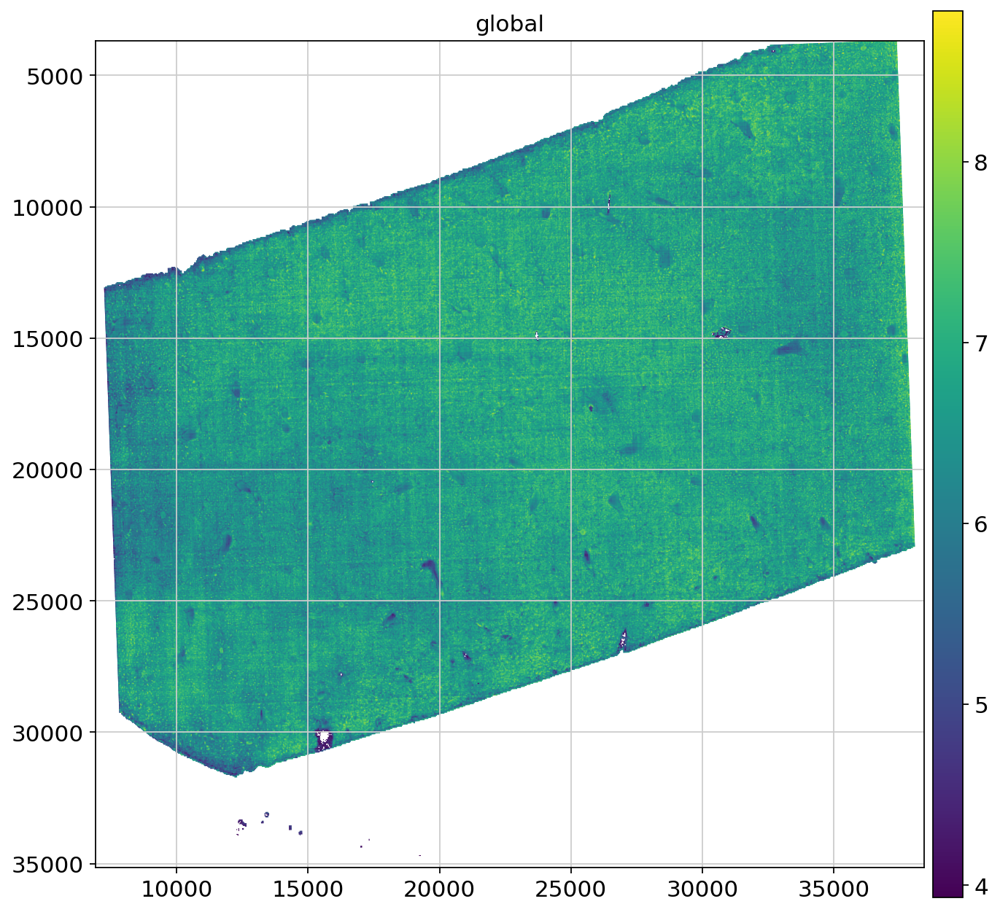

In [ ]:
plt.figure(figsize=(10, 10))
ax = plt.gca()

gene_name =  "log1p_total_counts"
sdata.pl.render_labels(labels_layer, color=gene_name, method="datashader", fill_alpha=1.0).pl.show(
    coordinate_systems="global", ax=ax
)

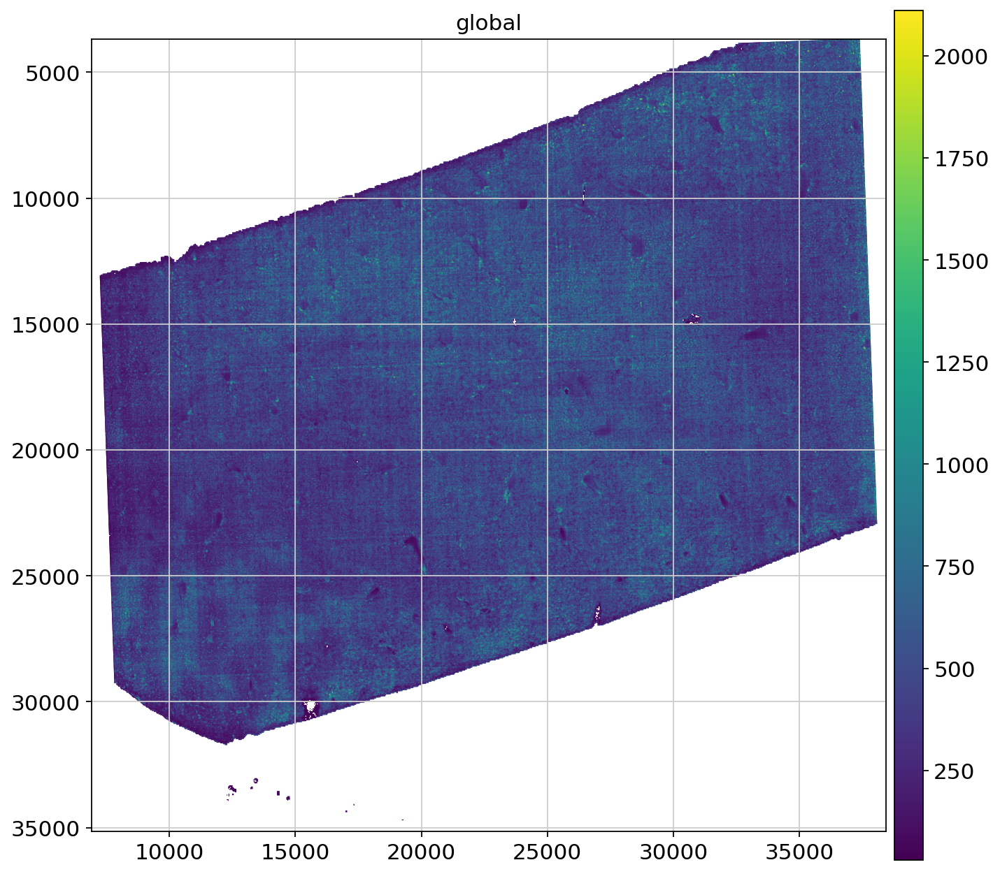

In [ ]:
plt.figure(figsize=(10, 10))
ax = plt.gca()

gene_name =  "n_genes_by_counts"
sdata.pl.render_labels(labels_layer, color=gene_name, method="datashader", fill_alpha=1.0).pl.show(
    coordinate_systems="global", ax=ax
)

/home/chananchidas/miniconda3/envs/harpy/lib/python3.10/site-packages/spatialdata_plot/pl/utils.py:782: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = color_source_vector.map(color_mapping)


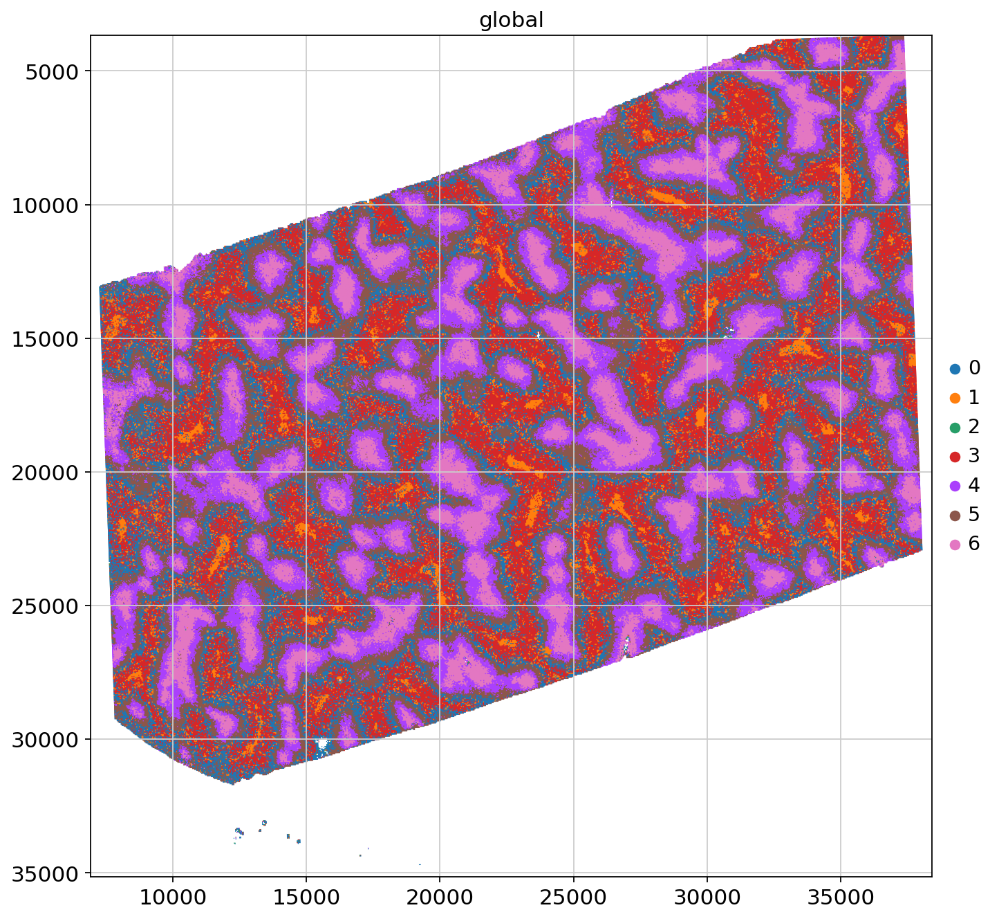

In [ ]:
plt.figure(figsize=(10, 10))
ax = plt.gca()

gene_name =  "clusters"
sdata.pl.render_labels(labels_layer, color=gene_name, method="datashader", fill_alpha=1.0).pl.show(
    coordinate_systems="global", ax=ax
)

## Marker gene visualization

We'll now look at the expression of KC, stellate cells, and hepatocyte marker genes.

In [ ]:
adata

AnnData object with n_obs × n_vars = 461427 × 17588
    obs: 'cell_ID', 'in_tissue', 'array_row', 'array_col', 'fov_labels', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'n_counts', 'clusters'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'clusters', 'clusters_colors', 'hvg', 'log1p', 'neighbors', 'pca', 'spatialdata_attrs', 'umap'
    obsm: 'X_pca', 'X_umap', 'spatial'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

In [29]:
merscope_genes = pd.read_csv('MERSCOPE_marker_genes_onehot.csv')
# Get genes in merscope_genes in column 'hepatocyte' that have value 1 and are in adata
hepa_genes = merscope_genes[merscope_genes['hepatocyte'] == 1]['Vizgen Gene']
hepa_genes = hepa_genes[hepa_genes.isin(adata.var_names)]

# Do the same for KC genes
kc_genes = merscope_genes[merscope_genes['KC'] == 1]['Vizgen Gene']
kc_genes = kc_genes[kc_genes.isin(adata.var_names)]

stellate_genes = merscope_genes[merscope_genes['stellate'] == 1]['Vizgen Gene']
stellate_genes = stellate_genes[stellate_genes.isin(adata.var_names)]

As expected, hepacotyes are expressed in all clusters (except 5?)

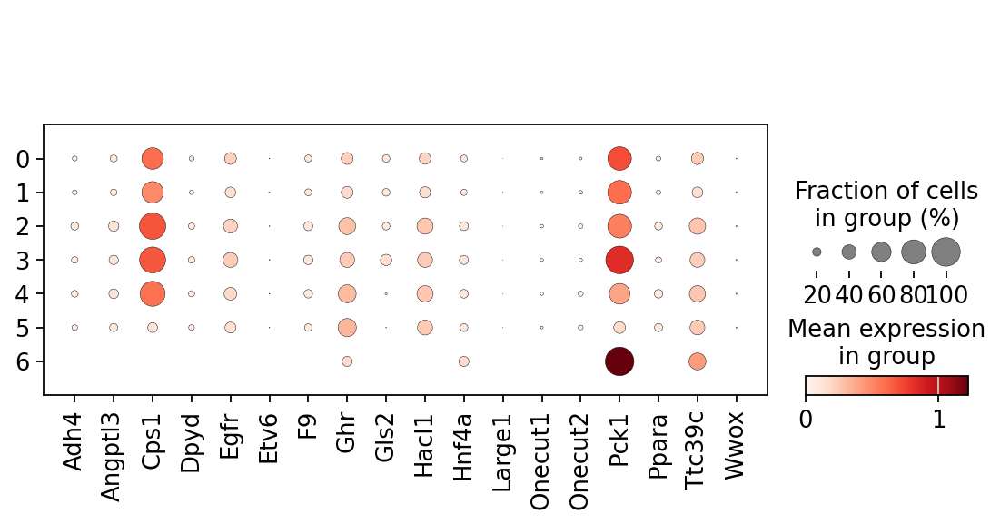

In [30]:
sc.pl.dotplot(adata, var_names=hepa_genes, groupby='clusters')

KC genes are most strongly expressed in cluster 1, which is also highly expressing Hal marker (perioortal zone).

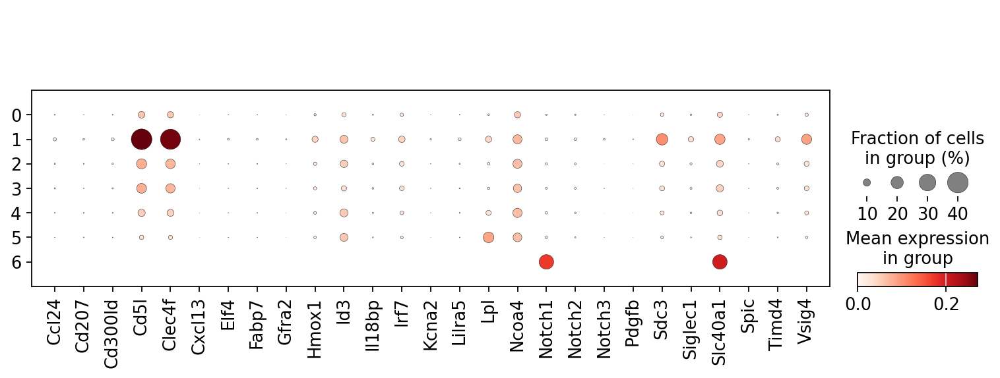

In [31]:
sc.pl.dotplot(adata, var_names=kc_genes, groupby='clusters')

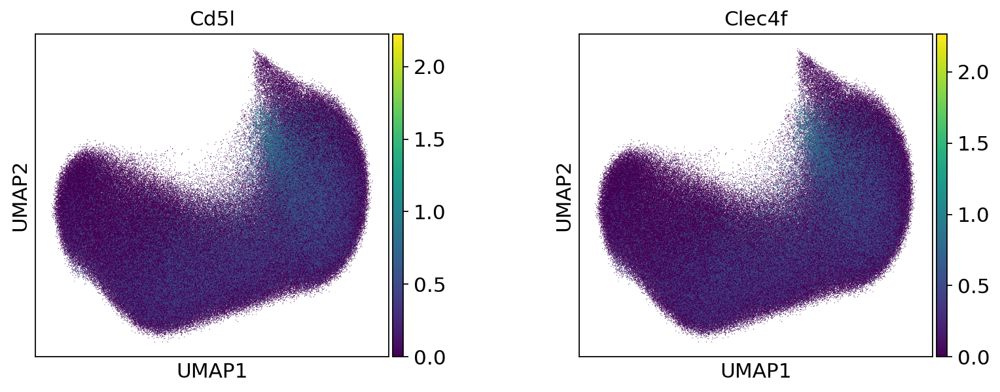

In [26]:
# The only markers expressed are "Cd5l" and "Clec4f" (trust me)
sc.pl.umap(adata, color=['Cd5l', 'Clec4f'], wspace=0.4, s=1)

Stellate cells marker genes (Col4a1, Ecm1, and Fcna) are also strongest expressed in cluster 1.

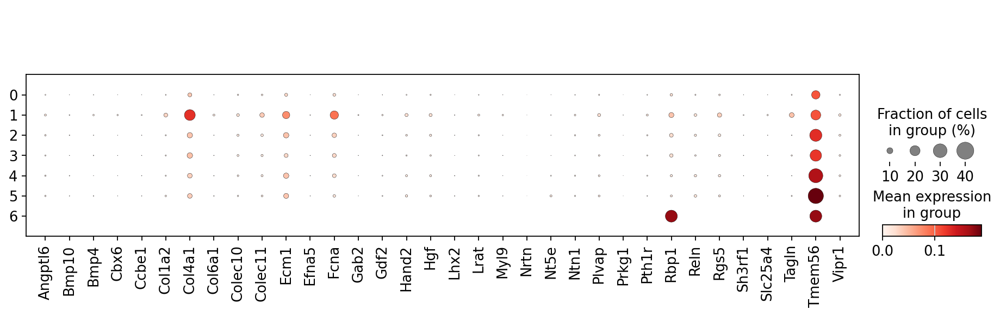

In [32]:
sc.pl.dotplot(adata, var_names=stellate_genes, groupby="clusters")

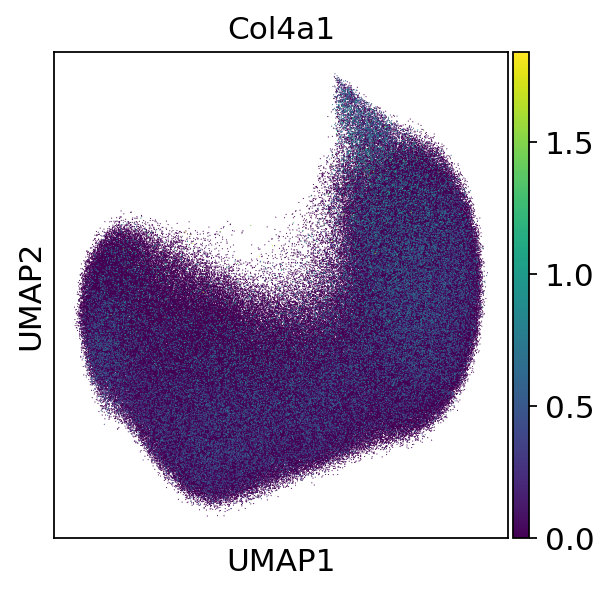

In [33]:
sc.pl.umap(adata, color=['Col4a1'], wspace=0.4, s=1)

## Cluster marker genes

Compute marker genes and plot a heatmap with expression levels of its top 10 marker genes across clusters.

In [ ]:
adata = sdata.tables["square_008um_pp"]

In [ ]:
sc.tl.rank_genes_groups(adata, "clusters", method="t-test")

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:15)


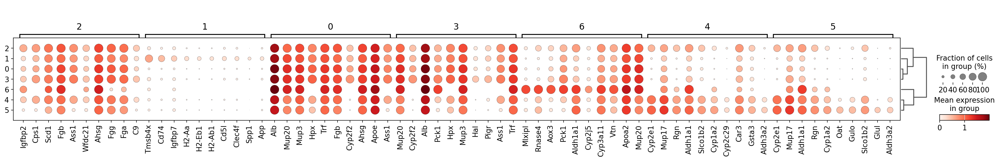

In [ ]:
#sc.pl.rank_genes_groups_heatmap(adata, n_genes=10, groupby="clusters")
sc.pl.rank_genes_groups_dotplot(adata, n_genes=10, groupby="clusters")

categories: 0, 1, 2, etc.
var_group_labels: 5


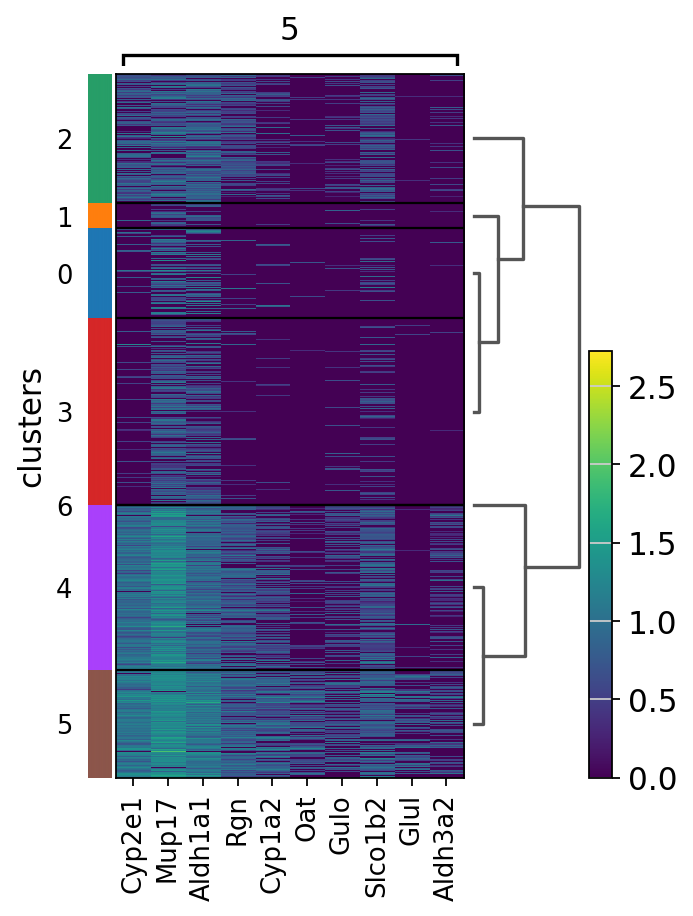

In [ ]:
sc.pl.rank_genes_groups_heatmap(adata, groups="5", n_genes=10, groupby="clusters")